In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import scienceplots  # noqa: F401
import torch
from dotenv import load_dotenv
from hydra import compose
from hydra.core.global_hydra import GlobalHydra
from hydra.initialize import initialize_config_dir
from hydra.utils import instantiate
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.utils import resample

load_dotenv()

plt.style.use("science")

## Initialise experiment configuration

In [2]:
# Define the relative path to your config directory
config_dir_relative = "../../src/conf"
config_dir_absolute = os.path.join(os.getcwd(), config_dir_relative)
GlobalHydra.instance().clear()

with initialize_config_dir(config_dir=config_dir_absolute, version_base=None):
    cfg = compose(
        config_name="experiment/rgbmnist_Flow/fm_embed",
        overrides=[
            "++seed=42",
            f"+paths.embedding_dir={os.environ["MNIST_EMBEDDINGS"]}",
            f"+lightning_loader.ckpt_path={os.environ["MNIST_FLOW_MODEL_CKPT"]}",
        ],
    )

## Create data structure for result visualisation

In [3]:
dataloader = instantiate(cfg.data.embedding_loader)
dataloader.setup()

x_cond_train = []
x_cond_test = []
x_uncond_train = []
x_uncond_test = []

x_delta_train = []
x_delta_test = []

n_iter = 10

y_vars = {
    "r": {
        "train": [],
        "test": [],
        "cond_scores": [[] for _ in range(n_iter)],
        "uncond_scores": [[] for _ in range(n_iter)],
    },
    "b": {
        "train": [],
        "test": [],
        "cond_scores": [[] for _ in range(n_iter)],
        "uncond_scores": [[] for _ in range(n_iter)],
    },
    "g": {
        "train": [],
        "test": [],
        "orig_scores": [],
        "cond_scores": [[] for _ in range(n_iter)],
        "uncond_scores": [[] for _ in range(n_iter)],
    },
    "digit": {
        "train": [],
        "test": [],
        "cond_scores": [[] for _ in range(n_iter)],
        "uncond_scores": [[] for _ in range(n_iter)],
    },
}

for train, val, test in zip(
    dataloader.train_dataloader(),
    dataloader.val_dataloader(),
    dataloader.test_dataloader(),
    strict=False,
):
    x_cond_train.append(
        torch.concat(
            (train["ode_cond_trajectory"], val["ode_cond_trajectory"])
        ).permute(1, 0, 2)
    )
    x_cond_test.append(test["ode_cond_trajectory"].permute(1, 0, 2))

    x_uncond_train.append(
        torch.concat(
            (train["ode_uncond_trajectory"], val["ode_uncond_trajectory"])
        ).permute(1, 0, 2)
    )
    x_uncond_test.append(test["ode_uncond_trajectory"].permute(1, 0, 2))

    x_delta_train.append(
        torch.concat(
            (
                train["ode_uncond_trajectory"] - train["ode_cond_trajectory"],
                val["ode_uncond_trajectory"] - val["ode_cond_trajectory"],
            )
        ).permute(1, 0, 2)
    )

    x_delta_test.append(
        (test["ode_uncond_trajectory"] - test["ode_cond_trajectory"]).permute(1, 0, 2)
    )

    for label in ["r", "g", "b", "digit"]:
        y_vars[label]["train"].append(torch.concat((train[label], val[label])))
        y_vars[label]["test"].append(test[label])

x_cond_train = torch.cat(x_cond_train, dim=1)
x_cond_test = torch.cat(x_cond_test, dim=1)

x_uncond_train = torch.cat(x_uncond_train, dim=1)
x_uncond_test = torch.cat(x_uncond_test, dim=1)

x_delta_train = torch.cat(x_delta_train, dim=1)
x_delta_test = torch.cat(x_delta_test, dim=1)

for label in ["r", "g", "b", "digit"]:
    y_vars[label]["train"] = torch.cat(y_vars[label]["train"], dim=0)
    y_vars[label]["test"] = torch.cat(y_vars[label]["test"], dim=0)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


## Classifier results

In [12]:
for label in ["r", "g", "b"]:
    for t in range(len(x_cond_train)):
        for i in range(n_iter):
            clf = LinearRegression()
            X_train, y_train = resample(
                x_cond_train[t],
                y_vars[label]["train"].squeeze(1),
                n_samples=int(0.025 * (len(x_cond_train[t]))),
                random_state=i,
            )
            clf.fit(X_train, y_train)
            y_vars[label]["cond_scores"][i].append(
                clf.score(x_cond_test[t], y_vars[label]["test"])
            )

for label in ["r", "g", "b"]:
    for t in range(len(x_uncond_train)):
        for i in range(n_iter):
            clf = LinearRegression()
            X_train, y_train = resample(
                x_uncond_train[t],
                y_vars[label]["train"].squeeze(1),
                n_samples=int(0.025 * (len(x_cond_train[t]))),
            )
            clf.fit(X_train, y_train)
            y_vars[label]["uncond_scores"][i].append(
                clf.score(x_uncond_test[t], y_vars[label]["test"])
            )

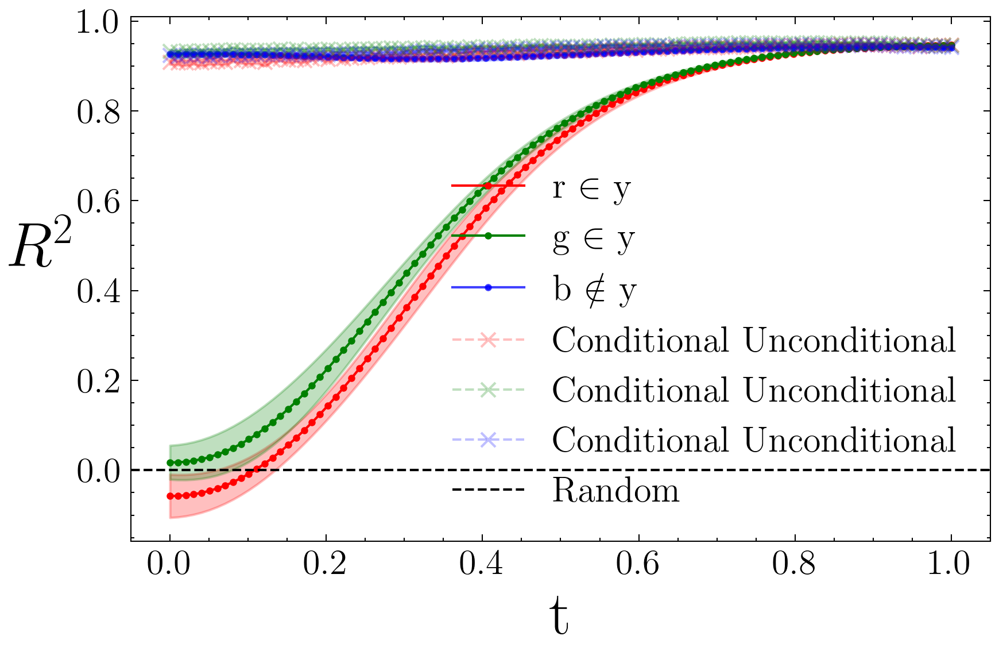

In [14]:
fig, (ax1) = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

# --- Loop 1: Conditional scores for 'r' and 'g' ---
for label in ["r", "g"]:
    scores = np.stack(y_vars[label]["cond_scores"])
    mean = scores.mean(axis=0)
    std = scores.std(axis=0)
    x_vals = torch.linspace(1, 0, 100)

    # Plot the mean line
    ax1.plot(
        x_vals, mean, label=f"{label}" + r" $\in$ y", c=label, marker="o", markersize=2
    )
    # Add the shaded confidence interval
    ax1.fill_between(
        x_vals,
        mean - std,
        mean + std,
        color=label,
        alpha=0.25,  # Use alpha to make the shading semi-transparent
    )

# --- Loop 2: Conditional scores for 'b' ---
for label in ["b"]:
    scores = np.stack(y_vars[label]["cond_scores"])
    mean = scores.mean(axis=0)
    std = scores.std(axis=0)
    x_vals = torch.linspace(1, 0, 100)

    # Plot the mean line
    ax1.plot(
        x_vals,
        mean,
        label=f"{label}" + r" $\notin$ y",
        c=label,
        alpha=0.75,
        markersize=2,
        marker="o",
    )
    # Add the shaded confidence interval
    ax1.fill_between(x_vals, mean - std, mean + std, color=label, alpha=0.25)

# --- Loop 3: Unconditional scores ---
for label in [
    "r",
    "g",
    "b",
]:
    scores = np.stack(y_vars[label]["uncond_scores"])
    mean = scores.mean(axis=0)
    std = scores.std(axis=0)
    x_vals = torch.linspace(1, 0, 100)

    # Plot the mean line
    ax1.plot(
        x_vals,
        mean,
        label=" Conditional Unconditional",
        c=label,
        ls="--",
        alpha=0.25,
        marker="x",
    )
    # Add the shaded confidence interval
    ax1.fill_between(x_vals, mean - std, mean + std, color=label, alpha=0.25)

# --- Final plot adjustments ---
ax1.tick_params(axis="both", which="major", labelsize=15)
ax1.axhline(y=0, label="Random", color="black", ls="--")
ax1.set_ylabel(r"$R^2$", fontsize=26, loc="center", rotation=0, labelpad=15)
ax1.set_xlabel("t", fontsize=26)
ax1.legend(fontsize=15)
fig.tight_layout()
# fig.savefig("./r2.pdf")

In [23]:
y_vars[label]["cond_scores"] = [[] for _ in range(n_iter)]
y_vars[label]["uncond_scores"] = [[] for _ in range(n_iter)]

for label in ["digit"]:
    for t in range(len(x_cond_train)):
        for i in range(n_iter):
            clf = LogisticRegression(max_iter=500)
            X_train, y_train = resample(
                x_cond_train[t],
                y_vars[label]["train"].squeeze(1),
                n_samples=int(0.025 * (len(x_cond_train[t]))),
                random_state=i,
            )
            clf.fit(X_train, y_train)
            y_vars[label]["cond_scores"][i].append(
                clf.score(x_cond_test[t], y_vars[label]["test"].squeeze(1))
            )

for label in ["digit"]:
    for t in range(len(x_uncond_train)):
        for i in range(n_iter):
            clf = LogisticRegression(max_iter=500)
            X_train, y_train = resample(
                x_uncond_train[t],
                y_vars[label]["train"].squeeze(1),
                n_samples=int(0.025 * (len(x_uncond_train[t]))),
                random_state=i,
            )
            clf.fit(X_train, y_train)
            y_vars[label]["uncond_scores"][i].append(
                clf.score(x_uncond_test[t], y_vars[label]["test"].squeeze(1))
            )

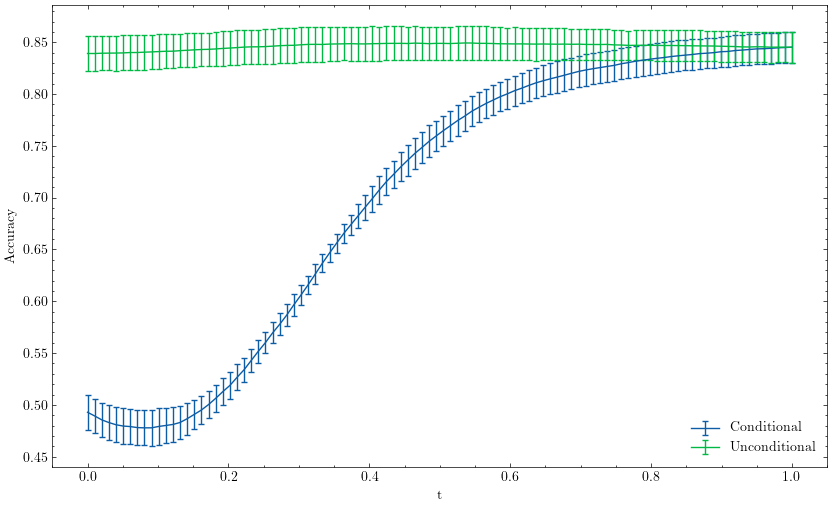

In [24]:
plt.figure(figsize=(10, 6))

for label in ["digit"]:
    scores = np.stack(y_vars[label]["cond_scores"])
    plt.errorbar(
        torch.linspace(1, 0, 100),
        scores.mean(axis=0),
        scores.std(axis=0),
        label="Conditional",
        capsize=2,
    )

for label in ["digit"]:
    scores = np.stack(y_vars[label]["uncond_scores"])
    plt.errorbar(
        torch.linspace(1, 0, 100),
        scores.mean(axis=0),
        scores.std(axis=0),
        label="Unconditional",
        capsize=2,
    )


plt.ylabel("Accuracy")
plt.xlabel("t")
plt.legend()

### Load the lightning loaders for models and data

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
raw_dataloader = instantiate(cfg.data.loader)
raw_dataloader.setup()
lightning_loader = instantiate(cfg.lightning_loader)
lightning_loader.to(device)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/phys2526/WhatWeDontCatalog/src/wwdc/models/rgbmnist.py:463: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user 

✅ Loaded state dict from checkpoint.


LightningFlowMatching(
  (vae): VAE(
    (encoder): Encoder(
      (encoder_block1): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      )
      (encoder_block2): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      )
      (encoder_block3): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1

## Embedding projection

In [22]:
from sklearn.manifold import TSNE

### VAE projection (t=1)

/tmp/ipykernel_1661333/3995884364.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(classes))


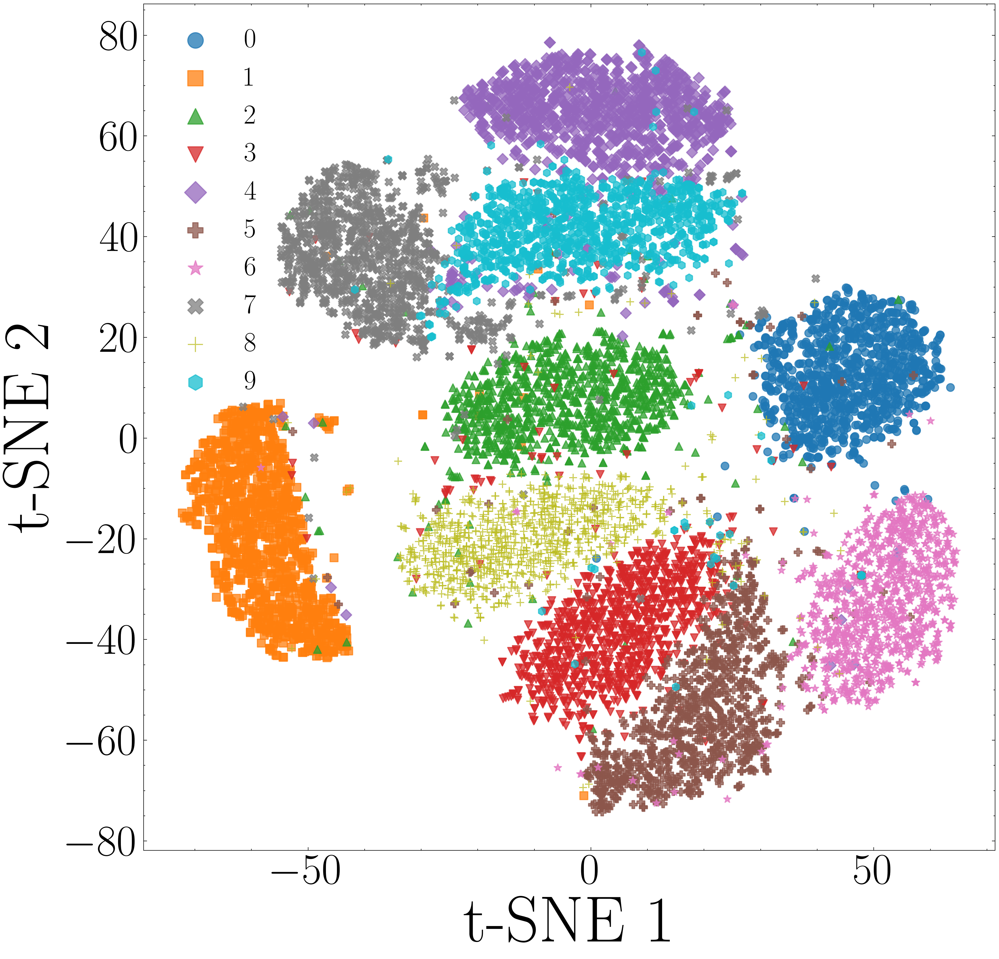

In [27]:
tnse = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
embedded_X_VAE = tnse.fit_transform(x_cond_train[0, :, :].detach().cpu().numpy())

plt.figure(figsize=(14, 14), dpi=300)
classes = np.unique(y_vars["digit"]["train"].numpy())

# 2. Define distinct colors and markers
# 'tab10' is a great colormap for 10 distinct categories
colors = plt.cm.get_cmap("tab10", len(classes))
markers = ["o", "s", "^", "v", "D", "P", "*", "X", "+", "h"]

# 3. Loop through each class and plot its points
for i, digit in enumerate(classes):
    # Select data points belonging to the current digit
    idx = np.where(y_vars["digit"]["train"].numpy() == digit)

    # Plot these points with a unique color, marker, and label
    plt.scatter(
        embedded_X_VAE[idx, 0],
        embedded_X_VAE[idx, 1],
        c=[colors(i)],  # Note: Pass color as a list to avoid a warning
        marker=markers[i],
        label=f"{digit}",
        alpha=0.75,
        s=50,  # Adjust marker size
    )

# 4. Finalize the plot
# plt.title('t-SNE Embedding of High-Dimensional Data')
plt.tick_params(axis="both", which="major", labelsize=40)
plt.xlabel("t-SNE 1", fontsize=60)
plt.ylabel("t-SNE 2", fontsize=60)
plt.legend(fontsize=25, markerscale=2)  # Display the legend
plt.show()

### Conditional Base projection (t=0)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_1705741/2099289718.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(classes))


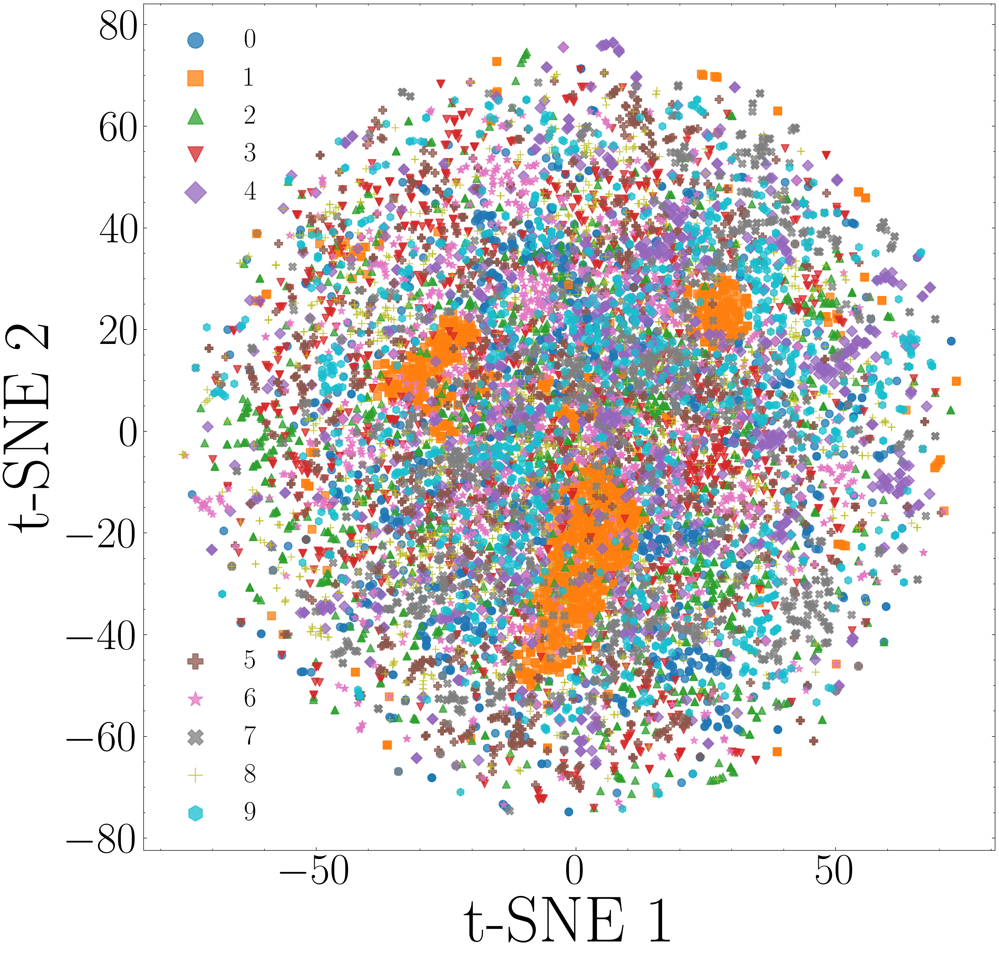

In [6]:
tnse_cond_base = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
embedded_X_cond_base = tnse_cond_base.fit_transform(
    x_cond_train[-1, :, :].detach().cpu().numpy()
)

fig = plt.figure(figsize=(14, 14), dpi=300)
ax = fig.add_subplot(1, 1, 1)
classes = np.unique(y_vars["digit"]["train"].numpy())

# 2. Define distinct colors and markers
# 'tab10' is a great colormap for 10 distinct categories
colors = plt.cm.get_cmap("tab10", len(classes))
markers = ["o", "s", "^", "v", "D", "P", "*", "X", "+", "h"]

components = [[], []]
# 3. Loop through each class and plot its points
for i, digit in enumerate(classes):
    # Select data points belonging to the current digit
    idx = np.where(y_vars["digit"]["train"].numpy() == digit)

    # Plot these points with a unique color, marker, and label
    v = plt.scatter(
        embedded_X_cond_base[idx, 0],
        embedded_X_cond_base[idx, 1],
        c=[colors(i)],  # Note: Pass color as a list to avoid a warning
        marker=markers[i],
        label=f"{digit}",
        alpha=0.75,
        s=50,  # Adjust marker size
    )

    if i < 5:
        components[0].append(v)
    else:
        components[1].append(v)

# 4. Finalize the plot
# plt.title('t-SNE Embedding of High-Dimensional Data')
plt.tick_params(axis="both", which="major", labelsize=40)
plt.xlabel("t-SNE 1", fontsize=60)
plt.ylabel("t-SNE 2", fontsize=60)

legend1 = ax.legend(handles=components[0], loc="upper left", fontsize=25, markerscale=2)
ax.add_artist(legend1)

ax.legend(handles=components[1], loc="lower left", fontsize=25, markerscale=2)

plt.show()

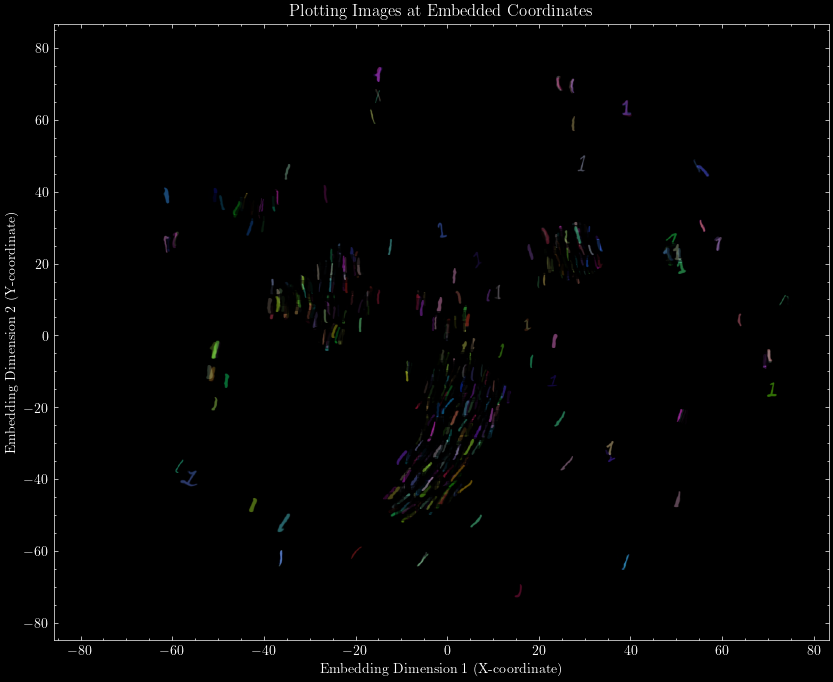

In [18]:
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

plt.style.use("dark_background")
# Assume all your variables
# (x_cond_train, idx, device,
# lightning_loader,
# embedded_X_cond_base)
# are already defined and loaded.

idx = np.where(y_vars["digit"]["train"].numpy() == 1)


# Let's set num_points based on the actual length of your index array
num_points = 1000  # len(idx[0])

# --- 1. Generate the Images Sequentially Based on idx ---
images = []

for i in range(num_points):
    z_t = (
        x_cond_train[0][torch.tensor(idx[0], dtype=torch.int), :][i]
        .unsqueeze(0)
        .to(device)
    )
    # x_cond_train[0, torch.tensor(idx[0]).shape, :][idx].unsqueeze(0)
    # .to(device)

    # Decode to get the image
    with torch.no_grad():
        X_recon = lightning_loader.vae.decoder(lightning_loader.vae.projection_up(z_t))

    # Reshape for plotting and display
    recon_img = X_recon.squeeze(0).permute(1, 2, 0).clamp(0, 1).detach().cpu().numpy()
    images.append(recon_img)
    # plt.imshow(recon_img)
    # plt.axis("off")


# --- 2. Plotting Logic ---


def plot_image_at_coordinate(ax, image, xy, zoom=1):
    """Plots an image at coordinates xy on axes ax."""
    oi = OffsetImage(image, zoom=zoom, alpha=0.5)
    ab = AnnotationBbox(oi, xy, frameon=False, pad=0.0)
    ax.add_artist(ab)


# Create the plot
fig, ax = plt.subplots(figsize=(10, 8))

# Loop through the indices
for i in range(num_points):
    # Get the coordinates for the i-th entry in idx
    coordinates = (
        embedded_X_cond_base[idx[0][i], 0],
        embedded_X_cond_base[idx[0][i], 1],
    )

    # --- THIS IS THE FIX ---
    # Get the i-th image from our generated list. This now correctly corresponds
    # to the i-th set of coordinates.
    image_to_plot = images[i]

    # Plot the image at its coordinates
    plot_image_at_coordinate(ax, image_to_plot, coordinates, zoom=0.5)

# Set plot limits and labels
ax.set_xlim(
    np.min(embedded_X_cond_base[:, 0]) - 10, np.max(embedded_X_cond_base[:, 0]) + 10
)
ax.set_ylim(
    np.min(embedded_X_cond_base[:, 1]) - 10, np.max(embedded_X_cond_base[:, 1]) + 10
)
ax.set_title("Plotting Images at Embedded Coordinates")
ax.set_xlabel("Embedding Dimension 1 (X-coordinate)")
ax.set_ylabel("Embedding Dimension 2 (Y-coordinate)")
# plt.grid(True, linestyle='--', alpha=0.6)
plt.show()  # Or plt.savefig("your_plot.png")

In [5]:
from PIL import Image

In [7]:
num_points = 5120

for i in range(num_points):
    z_t = x_cond_test[0][i].unsqueeze(0).to(device)

    # Decode to get the image
    with torch.no_grad():
        X_recon = lightning_loader.vae.decoder(lightning_loader.vae.projection_up(z_t))

    # Reshape for plotting and display
    recon_img = X_recon.squeeze(0).permute(1, 2, 0).clamp(0, 1).detach().cpu().numpy()

    image_array_uint8 = (recon_img * 255).astype(np.uint8)

    # 4. Create an image object from the array
    pil_image = Image.fromarray(image_array_uint8)

    # Or save it to a file
    pil_image.save(
        f"/data/dtce-schmidt/phys2526/rgbmnist/rgbmnist_FlowMatch/embeddings_flowmatch/images/img_{i}.png"
    )
    # plt.imshow(recon_img)
    # plt.axis("off")

### Unonditional Base projection (t=0)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_1906697/2785809401.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(classes))


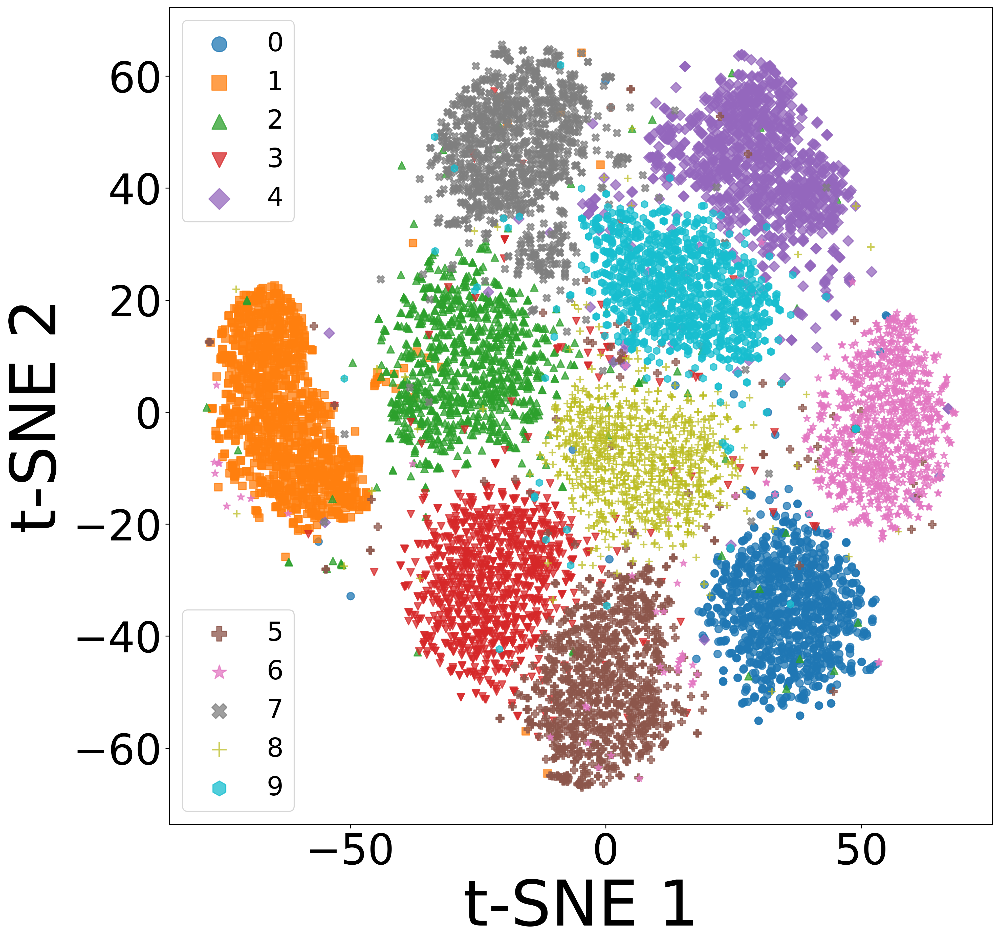

In [23]:
plt.style.use("default")

tnse_uncond_base = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
embedded_X_uncond_base = tnse_uncond_base.fit_transform(
    x_uncond_train[-1, :, :].detach().cpu().numpy()
)

fig = plt.figure(figsize=(14, 14), dpi=300)
ax = fig.add_subplot(1, 1, 1)
classes = np.unique(y_vars["digit"]["train"].numpy())

# 2. Define distinct colors and markers
# 'tab10' is a great colormap for 10 distinct categories
colors = plt.cm.get_cmap("tab10", len(classes))
markers = ["o", "s", "^", "v", "D", "P", "*", "X", "+", "h"]

components = [[], []]

# 3. Loop through each class and plot its points
for i, digit in enumerate(classes):
    # Select data points belonging to the current digit
    idx = np.where(y_vars["digit"]["train"].numpy() == digit)

    # Plot these points with a unique color, marker, and label
    v = plt.scatter(
        embedded_X_uncond_base[idx, 0],
        embedded_X_uncond_base[idx, 1],
        c=[colors(i)],  # Note: Pass color as a list to avoid a warning
        marker=markers[i],
        label=f"{digit}",
        alpha=0.75,
        s=50,  # Adjust marker size
    )
    if i < 5:
        components[0].append(v)
    else:
        components[1].append(v)

# 4. Finalize the plot
# plt.title('t-SNE Embedding of High-Dimensional Data')
plt.tick_params(axis="both", which="major", labelsize=40)
plt.xlabel("t-SNE 1", fontsize=60)
plt.ylabel("t-SNE 2", fontsize=60)

legend1 = ax.legend(handles=components[0], loc="upper left", fontsize=25, markerscale=2)
ax.add_artist(legend1)

ax.legend(handles=components[1], loc="lower left", fontsize=25, markerscale=2)

plt.show()

## Style transfer

In [8]:
plt.style.use("dark_background")
T = torch.linspace(0, 1, 5)  # sample times
T = T.to(device=device)
step_size = 0.05

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        # print(type(batch[k]))
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

output = lightning_loader.predict_step(batch)
solution_trajectory_cond = output["output_cond"]["sol"]
solution_trajectory_uncond = output["output_uncond"]["sol"]

sol_cond = lightning_loader.solver.sample(
    time_grid=T,
    x_init=solution_trajectory_cond[-1],  # torch.rand_like(solution_trajectory[-1]),#
    y=batch["catalog"],
    p_mask=0.0,
    step_size=step_size,
    return_intermediates=True,
)

sol_uncond = lightning_loader.solver.sample(
    time_grid=T,
    x_init=solution_trajectory_uncond[-1],  # torch.rand_like(solution_trajectory[-1]),#
    y=batch["catalog"],
    p_mask=1.0,
    step_size=step_size,
    return_intermediates=True,
)

# --- 1. Plotting Setup ---
N_IMAGES = min(14, sol_cond.shape[1])
N_TIMESTEPS = sol_cond.shape[0]

# Total columns = Uncond series + Original + Cond series
total_columns = 2 * N_TIMESTEPS + 1
# The center is for the "Original" image
center_column_idx = N_TIMESTEPS

# Create the figure
fig, axes = plt.subplots(
    nrows=N_IMAGES,
    ncols=total_columns,
    figsize=(total_columns * 2, N_IMAGES * 2),
    dpi=300,
)

# --- 2. Main Plotting Loop ---
for i in range(N_IMAGES):  # Loop over each sample/row
    # --- Plot the Original image in the Center ---
    ax_center = axes[i, center_column_idx]
    ax_center.imshow(batch["X"][i].permute(1, 2, 0).detach().cpu().numpy())
    ax_center.axis("off")
    if i == 0:
        ax_center.set_title("Original", fontsize=30)

    # --- Plot the Time Series on the Left and Right Wings ---

    # --- LEFT SIDE: Unconditional Series ---
    # These plots go in the first N_TIMESTEPS columns
    for t_idx in range(N_TIMESTEPS):
        ax_left = axes[i, t_idx]
        with torch.no_grad():
            z_t_uncond = sol_uncond[t_idx, i].unsqueeze(0)
            X_recon_uncond = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t_uncond)
            )
        recon_img_uncond = (
            X_recon_uncond.squeeze(0).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
        )
        ax_left.imshow(recon_img_uncond)
        ax_left.axis("off")
        if i == 0:
            if t_idx == N_TIMESTEPS - 1:
                ax_left.set_title(f"VAE \n t={T[t_idx]:.2f}", fontsize=30)
            else:
                ax_left.set_title(f"t={T[t_idx]:.2f}", fontsize=30)

    # --- RIGHT SIDE: Conditional Series (Reversed) ---
    # These plots start after the "Original" image
    for plot_col_idx, t_idx in enumerate(reversed(range(N_TIMESTEPS))):
        ax_right = axes[i, plot_col_idx + center_column_idx + 1]
        with torch.no_grad():
            z_t_cond = sol_cond[t_idx, i].unsqueeze(0)
            X_recon_cond = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t_cond)
            )
        recon_img_cond = (
            X_recon_cond.squeeze(0).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
        )
        ax_right.imshow(recon_img_cond)
        ax_right.axis("off")
        if i == 0:
            if t_idx == N_TIMESTEPS - 1:
                ax_right.set_title(f"VAE \n t={T[t_idx]:.2f}", fontsize=30)
            else:
                ax_right.set_title(f"t={T[t_idx]:.2f}", fontsize=30)

# --- 3. Final Adjustments ---
plt.tight_layout()
plt.show()
# plt.savefig("./plots/mnist/cond_generation.png", dpi=300)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torchdiffeq/_impl/misc.py:306: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")


/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torchdiffeq/_impl/misc.py:306: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")


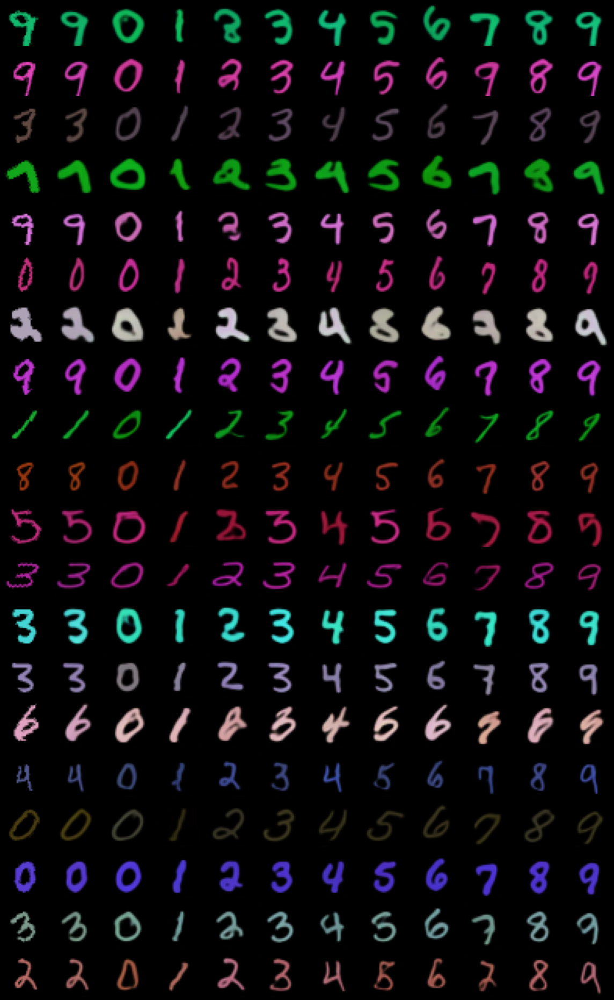

In [13]:
plt.style.use("dark_background")
plt.style.use("science")

T = torch.linspace(0, 1, 10)  # sample times
T = T.to(device=device)
step_size = 0.05

N_IMAGES = 20  # min(4, sol.shape[1])

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        # print(type(batch[k]))
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

edits = [[] for _ in range(N_IMAGES)]
# originals = [[] or i in range(N_IMAGES)]

with torch.no_grad():
    # Pass the batch through your VAE module to get the output dictionary
    vae_output = lightning_loader.vae(batch["X"])
    reconstructions = vae_output["recon"].detach().cpu()

for digit in range(0, 10, 1):
    conditioning["digit"] = torch.ones_like(
        conditioning["digit"], dtype=torch.long, device=device
    ) * torch.tensor(digit, dtype=torch.long, device=device)

    output = lightning_loader.predict_step(batch)
    solution_trajectory = output["output_uncond"]["sol"]

    sol = lightning_loader.solver.sample(
        time_grid=T,
        x_init=solution_trajectory[-1],  # torch.rand_like(solution_trajectory[-1]),#
        y=batch["catalog"],
        p_mask=0.0,
        step_size=step_size,
        return_intermediates=True,
    )

    # 2. Define plot dimensions

    N_TIMESTEPS = sol.shape[0]

    # 3. Create the main plot figure

    # 4. Loop through each image and time step to plot
    for i in range(N_IMAGES):  # Loop over rows (each image sample)
        # Set the row title

        """axes[0, 1].set_title("VAE", fontsize=30)
        axes[i, 1].imshow(reconstructions[i].permute(1,2,0).numpy())
        axes[i, 1].axis("off")"""

        """axes[0, 0].set_title("Original", fontsize=30)
        axes[i, 0].imshow(
        batch["X"][i].permute(1,2,0).detach().cpu().numpy()
    )
        axes[i, 0].axis("off")"""

        z_t = sol[-1, i].unsqueeze(0)

        # Decode to get the image
        with torch.no_grad():
            X_recon = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t)
            ).squeeze(0)

        edits[i].append(X_recon)

        """axes[0, 2].set_title("Flow edit", fontsize=30)
        axes[i, 2].imshow(X_recon.permute(1,2,0).detach().cpu().numpy())
        axes[i, 2].axis("off")"""

    # Final adjustments and save
    # plt.tight_layout(rect=[0.03, 0, 1, 0.95])
edits_ = torch.cat(
    [torch.cat(edit, dim=0).view(10, 3, 28, 28) for edit in edits], dim=0
).view(-1, 10, 3, 28, 28)

fig, axes = plt.subplots(nrows=N_IMAGES, ncols=12, figsize=(12, N_IMAGES))

for i in range(N_IMAGES):
    # axes[0, 0].set_title("Original", fontsize=30)
    axes[i, 0].imshow(batch["X"][i].permute(1, 2, 0).detach().cpu().numpy())
    axes[i, 0].axis("off")

    # axes[0, 1].set_title("VAE", fontsize=30)
    axes[i, 1].imshow(reconstructions[i].permute(1, 2, 0).numpy())
    axes[i, 1].axis("off")

    for j in range(0, 10, 1):
        # axes[0, j + 2].set_title(f"y = {j}", fontsize=30)
        axes[i, j + 2].imshow(edits_[i, j].permute(1, 2, 0).detach().cpu().numpy())
        axes[i, j + 2].axis("off")

    # Final adjustments and save
    plt.tight_layout(rect=[0.03, 0, 1, 0.95])

In [6]:
import torch.nn as nn
from flow_matching.solver import ODESolver


class ConditionedVelocityModelWrapper(nn.Module):
    """Wrapper around velocity model to inject month condition during inference.
    Implements classifier-free guidance according to the formula:
    u ← (1-w)*u_null + w*u_cond
    where:
    - u_null is the velocity with condition dropped
    - u_cond is the velocity with condition intact
    - w is the cfg_scale (default=1.0, which means no guidance)
    """

    def __init__(self, velocity_model, cfg_scale=1.0):
        super().__init__()
        self.velocity_model = velocity_model
        self.cfg_scale = cfg_scale

    def forward(self, x, t, **model_extras):
        """Forward pass with classifier-free guidance.

        Args:
            x: Input tensor (batch_size, ...)
            t: Time tensor (batch_size, ) or ()

        Returns:
            Predicted velocity with CFG applied if cfg_scale > 1.0
        """

        y = model_extras["y"]
        p_mask = model_extras["p_mask"]

        if self.cfg_scale == 1.0:
            return self.velocity_model(x_t=x, t=t, y=y, p_mask=p_mask)

        batch_size = x.shape[0]
        if t.dim() == 0:
            t = t.unsqueeze(0).expand(batch_size)

        v_cond = self.velocity_model(x_t=x, t=t, y=y, p_mask=0.0)
        v_null = self.velocity_model(x_t=x, t=t, y=y, p_mask=1.0)

        return (1 - self.cfg_scale) * v_null + self.cfg_scale * v_cond


step_size = 0.01
eps_time = 1e-2
T = torch.linspace(0, 1, 20)  # sample times
T = T.to(device=device)

step_size = 0.05

N_IMAGES = 3  # 20  # min(4, sol.shape[1])

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


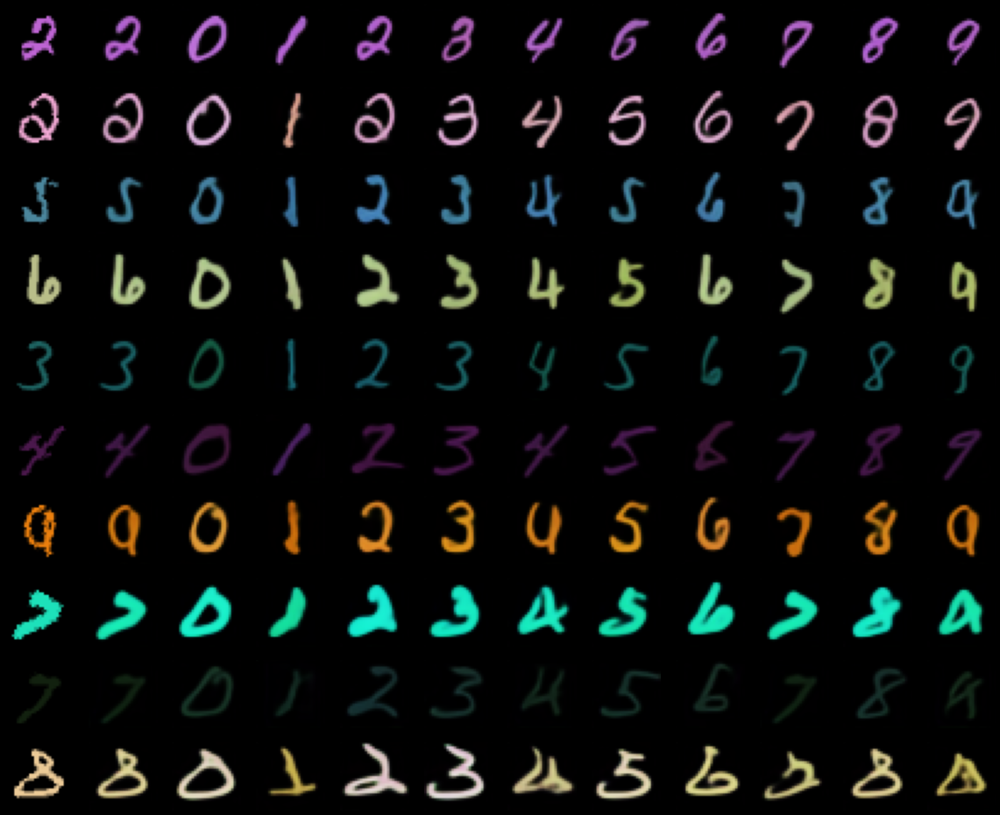

In [9]:
plt.style.use("dark_background")

# step size for ode solver
step_size = 0.005

eps_time = 1e-2
T = torch.linspace(0, 1, 50)  # sample times
T = T.to(device=device)

# T = torch.linspace(0, 1, 10)  # sample times
# T.to(device=device)

N_IMAGES = 10  # 20 # min(4, sol.shape[1])

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

vae_output = lightning_loader.vae(batch["X"])

# let's use the original sampler here.
wrapped_vf = ConditionedVelocityModelWrapper(
    velocity_model=lightning_loader.vf,
    cfg_scale=1.0,
)

solver = ODESolver(velocity_model=wrapped_vf)
orig_sol = solver.sample(
    time_grid=torch.linspace(1, 0, 50),
    x_init=vae_output["z"],  # torch.rand_like(solution_trajectory[-1]),#
    y=batch["catalog"],
    p_mask=0.0,
    step_size=step_size,
    return_intermediates=True,
)

edits = [[] for _ in range(N_IMAGES)]

with torch.no_grad():
    vae_output = lightning_loader.vae(batch["X"])
    reconstructions = vae_output["recon"].detach().cpu()

for digit in range(0, 10, 1):
    conditioning["digit"] = torch.ones_like(
        conditioning["digit"], dtype=torch.long, device=device
    ) * torch.tensor(digit, dtype=torch.long, device=device)

    wrapped_vf = ConditionedVelocityModelWrapper(
        velocity_model=lightning_loader.vf,
        cfg_scale=1.0,
    )

    solver = ODESolver(velocity_model=wrapped_vf)
    # fix to have different CFG scales forward and backwards

    sol = solver.sample(
        time_grid=torch.linspace(0, 1, 50),
        x_init=orig_sol[-1],
        y=batch["catalog"],
        p_mask=0.0,
        step_size=step_size,
        return_intermediates=True,
    )

    N_TIMESTEPS = sol.shape[0]
    for i in range(N_IMAGES):  # Loop over rows (each image sample)
        z_t = sol[-1, i].unsqueeze(0)

        # Decode to get the image
        with torch.no_grad():
            X_recon = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t)
            ).squeeze(0)

        edits[i].append(X_recon)

edits_ = torch.cat(
    [torch.cat(edit, dim=0).view(10, 3, 28, 28) for edit in edits], dim=0
).view(-1, 10, 3, 28, 28)

fig, axes = plt.subplots(nrows=N_IMAGES, ncols=12, figsize=(12, N_IMAGES))

for i in range(N_IMAGES):
    # axes[0, 0].set_title("Original", fontsize=30)
    axes[i, 0].imshow(batch["X"][i].permute(1, 2, 0).detach().cpu().numpy())
    axes[i, 0].axis("off")

    # axes[0, 1].set_title("VAE", fontsize=30)
    axes[i, 1].imshow(reconstructions[i].permute(1, 2, 0).numpy())
    axes[i, 1].axis("off")

    for j in range(0, 10, 1):
        axes[i, j + 2].imshow(edits[i][j].permute(1, 2, 0).detach().cpu().numpy())
        axes[i, j + 2].axis("off")

plt.tight_layout(rect=[0.03, 0, 1, 0.95])

/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 39 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torchdiffeq/_impl/misc.py:306: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")
/data/dtce-schmidt/phys2526/miniconda3/envs/wwdc/lib/python3.12/site-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally a

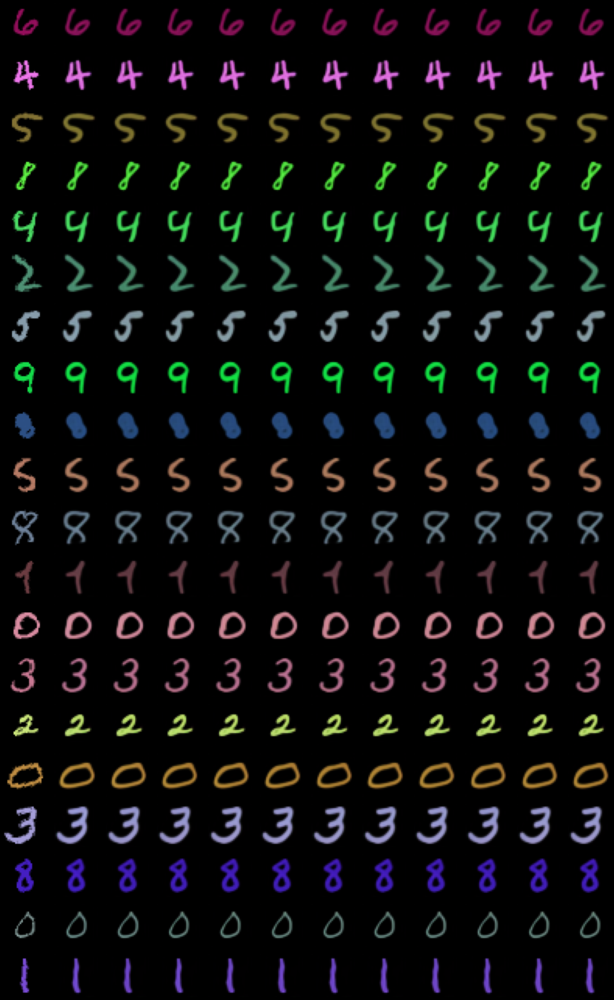

In [5]:
plt.style.use("dark_background")
plt.style.use("science")

T = torch.linspace(0, 1, 10)  # sample times
T = T.to(device=device)
step_size = 0.05

N_IMAGES = 20  # min(4, sol.shape[1])

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        # print(type(batch[k]))
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

edits = [[] for _ in range(N_IMAGES)]
# originals = [[] or i in range(N_IMAGES)]

with torch.no_grad():
    # Pass the batch through your VAE module to get the output dictionary
    vae_output = lightning_loader.vae(batch["X"])
    reconstructions = vae_output["recon"].detach().cpu()

for digit in range(0, 10, 1):
    conditioning["digit"] = torch.ones_like(
        conditioning["digit"], dtype=torch.long, device=device
    ) * torch.tensor(digit, dtype=torch.long, device=device)

    output = lightning_loader.predict_step(batch)
    solution_trajectory = output["output_cond"]["sol"]

    sol = lightning_loader.solver.sample(
        time_grid=T,
        x_init=solution_trajectory[-1],  # torch.rand_like(solution_trajectory[-1]),#
        y=batch["catalog"],
        p_mask=0.0,
        step_size=step_size,
        return_intermediates=True,
    )

    N_TIMESTEPS = sol.shape[0]
    for i in range(N_IMAGES):  # Loop over rows (each image sample)
        z_t = sol[-1, i].unsqueeze(0)

        # Decode to get the image
        with torch.no_grad():
            X_recon = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t)
            ).squeeze(0)

        edits[i].append(X_recon)

edits_ = torch.cat(
    [torch.cat(edit, dim=0).view(10, 3, 28, 28) for edit in edits], dim=0
).view(-1, 10, 3, 28, 28)

fig, axes = plt.subplots(nrows=N_IMAGES, ncols=12, figsize=(12, N_IMAGES))

for i in range(N_IMAGES):
    # axes[0, 0].set_title("Original", fontsize=30)
    axes[i, 0].imshow(batch["X"][i].permute(1, 2, 0).detach().cpu().numpy())
    axes[i, 0].axis("off")

    # axes[0, 1].set_title("VAE", fontsize=30)
    axes[i, 1].imshow(reconstructions[i].permute(1, 2, 0).numpy())
    axes[i, 1].axis("off")

    for j in range(0, 10, 1):
        axes[i, j + 2].imshow(edits_[i, j].permute(1, 2, 0).detach().cpu().numpy())
        axes[i, j + 2].axis("off")

    plt.tight_layout(rect=[0.03, 0, 1, 0.95])

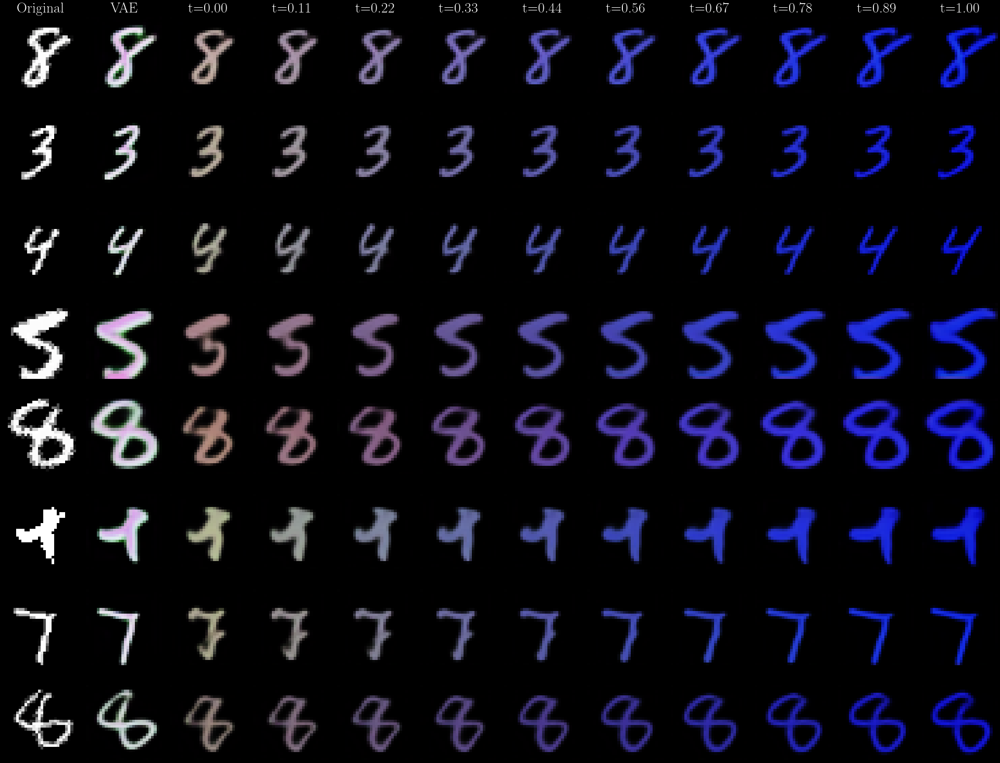

In [16]:
T = torch.linspace(0, 1, 10)  # sample times
T = T.to(device=device)
step_size = 0.05

for batch in raw_dataloader.train_dataloader():
    for k, v in batch.items():
        # print(type(batch[k]))
        if isinstance(batch[k], dict):
            for k_, v_ in batch[k].items():
                batch[k][k_] = v_.to(device)
        else:
            batch[k] = v.to(device)
    batch["X"] = batch["X"] / batch["X"].amax(dim=(2, 3)).view(
        batch["X"].shape[0], batch["X"].shape[1], 1, 1
    )  # torch.ones_like(batch["X"]) # colour all digits white
    break

conditioning = batch["catalog"]
for k in conditioning:
    conditioning[k] = conditioning[k].to(device)

conditioning["r"] = torch.zeros_like(
    conditioning["r"], dtype=torch.float, device=device
)
conditioning["g"] = torch.zeros_like(
    conditioning["r"], dtype=torch.float, device=device
)

output = lightning_loader.predict_step(batch)
solution_trajectory = output["output_uncond"]["sol"]

sol = lightning_loader.solver.sample(
    time_grid=T,
    x_init=solution_trajectory[-1],  # torch.rand_like(solution_trajectory[-1]),#
    y=batch["catalog"],
    p_mask=0.0,
    step_size=step_size,
    return_intermediates=True,
)

# 2. Define plot dimensions
N_IMAGES = min(8, sol.shape[1])
N_TIMESTEPS = sol.shape[0]

# 3. Create the main plot figure
fig, axes = plt.subplots(
    nrows=N_IMAGES, ncols=N_TIMESTEPS + 2, figsize=(N_TIMESTEPS * 2, N_IMAGES * 2)
)

# 4. Loop through each image and time step to plot
for i in range(N_IMAGES):  # Loop over rows (each image sample)
    for t_idx in range(N_TIMESTEPS):  # Loop over columns (each time step)
        ax = axes[i, t_idx + 2]

        # Get the latent representation for the i-th image at this time step
        z_t = sol[t_idx, i].unsqueeze(0)

        # Decode to get the image
        with torch.no_grad():
            X_recon = lightning_loader.vae.decoder(
                lightning_loader.vae.projection_up(z_t)
            )

        # Reshape for plotting and display
        recon_img = (
            X_recon.squeeze(0).permute(1, 2, 0).clamp(0, 1).detach().cpu().numpy()
        )
        ax.imshow(recon_img)
        ax.axis("off")

        # Set the column title (only for the first row)
        if i == 0:
            ax.set_title(f"t={T[t_idx]:.2f}", fontsize=20)

    with torch.no_grad():
        # Pass the batch through your VAE module to get the output dictionary
        vae_output = lightning_loader.vae(batch["X"])
        reconstructions = vae_output["recon"].detach().cpu()

    axes[i, 1].imshow(reconstructions[i].permute(1, 2, 0).numpy())
    axes[0, 1].set_title("VAE", fontsize=20)
    axes[i, 1].axis("off")

    axes[i, 0].imshow(
        batch["X"][i].squeeze(0).permute(1, 2, 0).clamp(0, 1).detach().cpu().numpy()
    )
    axes[0, 0].set_title("Original", fontsize=20)
    axes[i, 0].axis("off")

# Final adjustments and save
plt.tight_layout(rect=[0.03, 0, 1, 0.95])